In [5]:
import talib
import numpy as np
np.random.seed(42)
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import pyplot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import ParameterGrid
from sklearn import metrics
from statistics import mean

In [6]:
df=pd.read_csv("C:/Users/dell/desktop/totalstock.csv")
df['Date'] = pd.to_datetime(df['Date'])
df=df.set_index('Date')
df.tail()

,Open,High,Low,Close,Adj Close,Volume,Company
Date,,,,,,,
2022-10-24,52.450001,52.720001,51.709999,51.970001,51.970001,854800,ngg
2022-10-25,53.000000,54.000000,52.919998,53.700001,53.700001,879300,ngg
2022-10-26,54.029999,54.320000,53.680000,53.790001,53.790001,485900,ngg
2022-10-27,53.930000,54.549999,53.930000,54.250000,54.250000,537500,ngg
2022-10-28,54.220001,55.320000,54.169998,55.299999,55.299999,460200,ngg


In [7]:
#Closing price
df_close = df.pivot_table(index = 'Date', columns = 'Company', values='Adj Close').dropna(axis=1)
df_close

Company,aapl,amd,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-01-03,181.259918,150.240005,207.860001,244.139999,156.752411,338.540008,70.250885,56.099998,106.440002,399.926666
2022-01-04,178.959457,144.419998,213.630005,241.729996,162.694855,336.529999,70.386894,49.820000,109.050003,383.196655
2022-01-05,174.199158,136.149994,213.070007,239.270004,159.720444,324.170013,69.706833,48.529999,110.250000,362.706665
2022-01-06,171.291183,136.229996,211.339996,237.300003,161.417328,332.459992,69.007339,52.130001,111.599998,354.899994
2022-01-07,171.460495,132.000000,215.500000,232.600006,163.016678,331.790008,69.570824,55.900002,115.989998,342.320007
...,...,...,...,...,...,...,...,...,...,...
2022-10-24,149.449997,58.700001,142.050003,274.619995,122.379997,129.720001,51.970001,44.459999,63.430000,211.250000
2022-10-25,152.339996,61.470001,146.649994,273.559998,122.699997,137.509995,53.700001,47.529999,65.239998,222.419998
2022-10-26,149.350006,59.730000,133.789993,280.429993,124.110001,129.820007,53.790001,53.090000,67.269997,224.639999


In [37]:
df_return=df_close.pct_change().dropna()
df_return.tail()

Company,aapl,amd,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-10-24,0.014803,-0.002040,0.005166,0.026156,0.001227,-0.002231,0.021022,-0.246057,0.000315,-0.014876
2022-10-25,0.019338,0.047189,0.032383,-0.003860,0.002615,0.060052,0.033288,0.069051,0.028535,0.052876
2022-10-26,-0.019627,-0.028307,-0.087692,0.025113,0.011491,-0.055923,0.001676,0.116979,0.031116,0.009981
2022-10-27,-0.030465,-0.018918,0.044622,-0.009129,0.003948,-0.245571,0.008552,0.000377,0.008771,0.002003
2022-10-28,0.075553,0.058191,0.029193,0.023104,0.011878,0.012865,0.019355,-0.003013,0.000000,0.015238


# Prediction

In [10]:
#get stock data
def stock_data(data,company):
    stock=data.loc[data['Company'] == company]
    stock=stock.drop(['Company'], axis=1)
    stock=stock.loc[:'2022-09-30']
    return stock

In [11]:
#feature engineering
def gen_feature(data):
    feature_names = []
    
    #get the moving average and RSI for our stock prices in 5, 10, 15 days.
    for n in [5, 10, 15]:
        data['ma' + str(n)] = talib.SMA(data['Adj Close'].values, timeperiod=n)
        data['rsi' + str(n)] = talib.RSI(data['Adj Close'].values, timeperiod=n)

        feature_names = feature_names + ['ma' + str(n), 'rsi' + str(n)]
        
    #calculate the daily volume change percentage and add the volume feature name to the list.    
    data['Volume_1d_change'] = data['Volume'].pct_change()
    volume_features = ['Volume_1d_change']
    feature_names.extend(volume_features)
    
    #target
    data['1d_future_close'] = data['Adj Close'].shift(-1)
    data['1d_close_future_pct'] = data['1d_future_close'].pct_change(1)
    data=data.dropna()
    return data, feature_names

In [12]:
def train_val_split(data,feature_names):
    X = data[feature_names]
    y = data['1d_future_close']

    X_train = X.loc[:'2022-07-29']
    y_train = y.loc[:'2022-07-29']
    X_val = X.loc['2022-08-01':]
    y_val = y.loc['2022-08-01':]
    return X_train, y_train ,X_val, y_val

# apple

In [8]:
mean_mse=[]

In [9]:
data=stock_data(df,'aapl')
data, feature=gen_feature(data)
X_train, y_train ,X_val, y_val=train_val_split(data,feature)

In [179]:
grid = {'n_estimators': [500], 'max_depth': [3,5], 'max_features': [4,6,7], 'random_state': [42]}
val_scores = []

rf_model = RandomForestRegressor()

for g in ParameterGrid(grid):
    rf_model.set_params(**g) 
    rf_model.fit(X_train, y_train)
    val_scores.append(rf_model.score(X_val, y_val))

best_index = np.argmax(val_scores)

print(val_scores[best_index],ParameterGrid(grid)[best_index])

0.8303660094700552 {'random_state': 42, 'n_estimators': 500, 'max_features': 4, 'max_depth': 3}


Mean Squared Error: 12.65516021851029


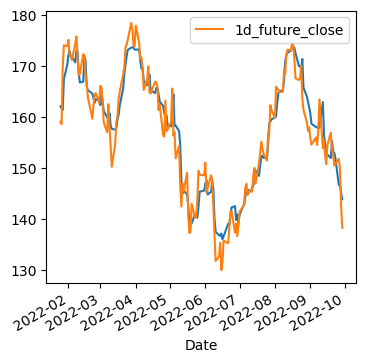

In [12]:
rf_model = RandomForestRegressor(n_estimators=500, max_depth=3, max_features=4, random_state=42)
rf_model.fit(X_train, y_train)
    
y_pred = rf_model.predict(X_val)
y_pred_series = pd.Series(y_pred, index=y_val.index)
#pred_val[str(c)]=y_pred_series
    
X=data[feature]
y = data['1d_future_close']
pred = rf_model.predict(X)
pred_series = pd.Series(pred, index=y.index)
#pred_price[str(c)]=pred_series
    

print('Mean Squared Error:', metrics.mean_squared_error(y_val, y_pred))
mse=metrics.mean_squared_error(y_val, y_pred)
mean_mse.append(mse)
ax = pred_series.plot( figsize=(4, 4))
data.plot(ax=ax, y='1d_future_close')
plt.show()

In [13]:
df_pred=pd.DataFrame()
df_pred['aapl']=y_pred_series

# amd

In [15]:
data=stock_data(df,'amd')
data, feature=gen_feature(data)
X_train, y_train ,X_val, y_val=train_val_split(data,feature)

In [202]:
grid = {'n_estimators': [500], 'max_depth': [7,10], 'max_features': [4,6,7], 'random_state': [42]}
val_scores = []

rf_model = RandomForestRegressor()

for g in ParameterGrid(grid):
    rf_model.set_params(**g) 
    rf_model.fit(X_train, y_train)
    val_scores.append(rf_model.score(X_val, y_val))

best_index = np.argmax(val_scores)

print(val_scores[best_index],ParameterGrid(grid)[best_index])

0.8076578357698656 {'random_state': 42, 'n_estimators': 500, 'max_features': 6, 'max_depth': 7}


Mean Squared Error: 28.511640389103373


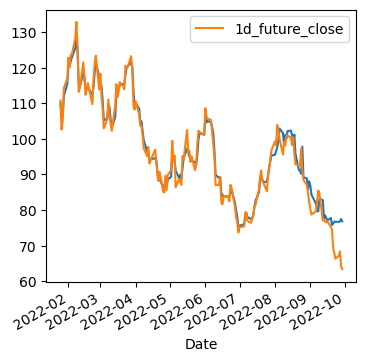

In [17]:
rf_model = RandomForestRegressor(n_estimators=500, max_depth=7, max_features=6, random_state=42)
rf_model.fit(X_train, y_train)
    
y_pred = rf_model.predict(X_val)
y_pred_series = pd.Series(y_pred, index=y_val.index)
#pred_val[str(c)]=y_pred_series
    
X=data[feature]
y = data['1d_future_close']
pred = rf_model.predict(X)
pred_series = pd.Series(pred, index=y.index)
#pred_price[str(c)]=pred_series
    

print('Mean Squared Error:', metrics.mean_squared_error(y_val, y_pred))
mse=metrics.mean_squared_error(y_val, y_pred)
mean_mse.append(mse)
ax = pred_series.plot( figsize=(4, 4))
data.plot(ax=ax, y='1d_future_close')
plt.show()

In [18]:
df_pred['amd']=y_pred_series

# ba

In [21]:
data=stock_data(df,'ba')
data, feature=gen_feature(data)
X_train, y_train ,X_val, y_val=train_val_split(data,feature)

In [228]:
grid = {'n_estimators': [300,500], 'max_depth': [10,20], 'max_features': [6], 'min_samples_split':[2,4],'random_state': [42]}
val_scores = []

rf_model = RandomForestRegressor()

for g in ParameterGrid(grid):
    rf_model.set_params(**g) 
    rf_model.fit(X_train, y_train)
    val_scores.append(rf_model.score(X_val, y_val))

best_index = np.argmax(val_scores)

print(val_scores[best_index],ParameterGrid(grid)[best_index])

0.7875507955796043 {'random_state': 42, 'n_estimators': 300, 'min_samples_split': 2, 'max_features': 6, 'max_depth': 20}


Mean Squared Error: 40.610583244923575


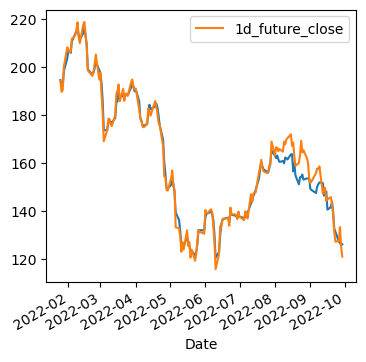

In [22]:
rf_model = RandomForestRegressor(n_estimators=300, max_depth=20, max_features=6, random_state=42)
rf_model.fit(X_train, y_train)
    
y_pred = rf_model.predict(X_val)
y_pred_series = pd.Series(y_pred, index=y_val.index)
#pred_val[str(c)]=y_pred_series
    
X=data[feature]
y = data['1d_future_close']
pred = rf_model.predict(X)
pred_series = pd.Series(pred, index=y.index)
#pred_price[str(c)]=pred_series
    

print('Mean Squared Error:', metrics.mean_squared_error(y_val, y_pred))
mse=metrics.mean_squared_error(y_val, y_pred)
mean_mse.append(mse)
ax = pred_series.plot( figsize=(4, 4))
data.plot(ax=ax, y='1d_future_close')
plt.show()

In [23]:
df_pred['ba']=y_pred_series

# biib

In [24]:
data=stock_data(df,'biib')
data, feature=gen_feature(data)
X_train, y_train ,X_val, y_val=train_val_split(data,feature)

In [244]:
grid = {'bootstrap': [False],
 'max_depth': [20],
 'max_features': ['sqrt'],
 'min_samples_leaf': [2],
 'n_estimators': [800,1000,1200,2000]}
val_scores = []

rf_model = RandomForestRegressor()

for g in ParameterGrid(grid):
    rf_model.set_params(**g) 
    rf_model.fit(X_train, y_train)
    val_scores.append(rf_model.score(X_val, y_val))

best_index = np.argmax(val_scores)

print(val_scores[best_index],ParameterGrid(grid)[best_index])

0.15394486373513705 {'n_estimators': 1000, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 20, 'bootstrap': False}


Mean Squared Error: 270.4673886352323


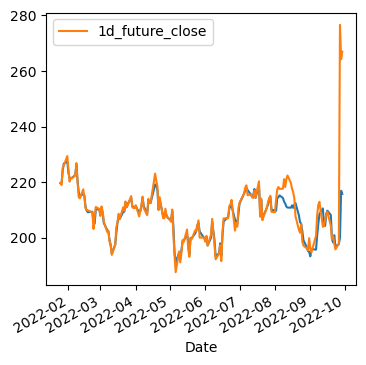

In [25]:
rf_model = RandomForestRegressor(n_estimators=1000, max_depth=20, max_features='sqrt',min_samples_leaf= 2,bootstrap=False)
rf_model.fit(X_train, y_train)
    
y_pred = rf_model.predict(X_val)
y_pred_series = pd.Series(y_pred, index=y_val.index)
#pred_val[str(c)]=y_pred_series
    
X=data[feature]
y = data['1d_future_close']
pred = rf_model.predict(X)
pred_series = pd.Series(pred, index=y.index)
#pred_price[str(c)]=pred_series
    

print('Mean Squared Error:', metrics.mean_squared_error(y_val, y_pred))
mse=metrics.mean_squared_error(y_val, y_pred)
mean_mse.append(mse)
ax = pred_series.plot( figsize=(4, 4))
data.plot(ax=ax, y='1d_future_close')
plt.show()

In [26]:
df_pred['biib']=y_pred_series

# jpm

In [27]:
data=stock_data(df,'jpm')
data, feature=gen_feature(data)
X_train, y_train ,X_val, y_val=train_val_split(data,feature)

In [258]:
grid ={'bootstrap': [False],
 'max_depth': [3,5,7],
 'max_features': ['auto','sqrt'],
 'min_samples_leaf': [2],
 'n_estimators': [400]}
val_scores = []

rf_model = RandomForestRegressor()

for g in ParameterGrid(grid):
    rf_model.set_params(**g) 
    rf_model.fit(X_train, y_train)
    val_scores.append(rf_model.score(X_val, y_val))

best_index = np.argmax(val_scores)

print(val_scores[best_index],ParameterGrid(grid)[best_index])

0.3848988082130117 {'n_estimators': 400, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 5, 'bootstrap': False}


Mean Squared Error: 13.43044750562958


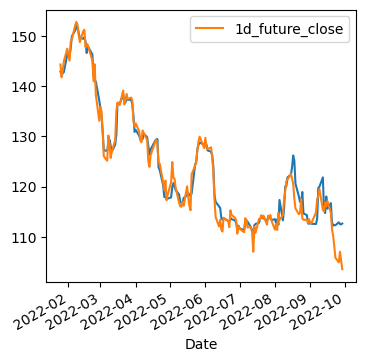

In [28]:
rf_model = RandomForestRegressor(n_estimators=400, max_depth=5, max_features='sqrt',min_samples_leaf= 2, bootstrap=False)
rf_model.fit(X_train, y_train)
    
y_pred = rf_model.predict(X_val)
y_pred_series = pd.Series(y_pred, index=y_val.index)
#pred_val[str(c)]=y_pred_series
    
X=data[feature]
y = data['1d_future_close']
pred = rf_model.predict(X)
pred_series = pd.Series(pred, index=y.index)
#pred_price[str(c)]=pred_series
    

print('Mean Squared Error:', metrics.mean_squared_error(y_val, y_pred))
mse=metrics.mean_squared_error(y_val, y_pred)
mean_mse.append(mse)
ax = pred_series.plot( figsize=(4, 4))
data.plot(ax=ax, y='1d_future_close')
plt.show()

In [29]:
df_pred['jpm']=y_pred_series

# meta

In [30]:
data=stock_data(df,'meta')
data, feature=gen_feature(data)
X_train, y_train ,X_val, y_val=train_val_split(data,feature)

In [279]:
grid ={'bootstrap': [False],
 'max_depth': [3],
 'max_features': ['auto','sqrt'],
 'min_samples_leaf': [2,4,6],
 'n_estimators': [400,800]}
val_scores = []

rf_model = RandomForestRegressor()

for g in ParameterGrid(grid):
    rf_model.set_params(**g) 
    rf_model.fit(X_train, y_train)
    val_scores.append(rf_model.score(X_val, y_val))

best_index = np.argmax(val_scores)

print(val_scores[best_index],ParameterGrid(grid)[best_index])

0.02531518666956245 {'n_estimators': 800, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 3, 'bootstrap': False}


Mean Squared Error: 177.64065377271876


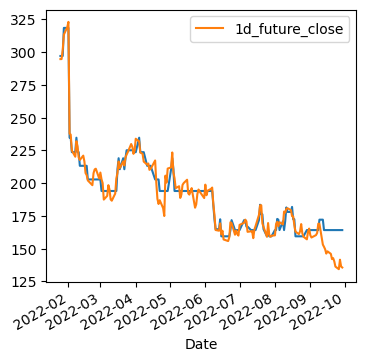

In [31]:
rf_model = RandomForestRegressor(n_estimators=800, max_depth=5, max_features='auto',min_samples_leaf= 2, bootstrap=False)
rf_model.fit(X_train, y_train)
    
y_pred = rf_model.predict(X_val)
y_pred_series = pd.Series(y_pred, index=y_val.index)
#pred_val[str(c)]=y_pred_series
    
X=data[feature]
y = data['1d_future_close']
pred = rf_model.predict(X)
pred_series = pd.Series(pred, index=y.index)
#pred_price[str(c)]=pred_series
    

print('Mean Squared Error:', metrics.mean_squared_error(y_val, y_pred))
mse=metrics.mean_squared_error(y_val, y_pred)
mean_mse.append(mse)
ax = pred_series.plot( figsize=(4, 4))
data.plot(ax=ax, y='1d_future_close')
plt.show()

In [32]:
df_pred['meta']=y_pred_series

# ngg

In [33]:
data=stock_data(df,'ngg')
data, feature=gen_feature(data)
X_train, y_train ,X_val, y_val=train_val_split(data,feature)

In [288]:
grid ={'bootstrap': [True,False],
 'max_depth': [3,5],
 'max_features': ['auto','sqrt'],
 'min_samples_leaf': [2],
 'n_estimators': [400]}
val_scores = []

rf_model = RandomForestRegressor()

for g in ParameterGrid(grid):
    rf_model.set_params(**g) 
    rf_model.fit(X_train, y_train)
    val_scores.append(rf_model.score(X_val, y_val))

best_index = np.argmax(val_scores)

print(val_scores[best_index],ParameterGrid(grid)[best_index])

0.3682506389217578 {'n_estimators': 400, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 5, 'bootstrap': False}


Mean Squared Error: 23.20678155448911


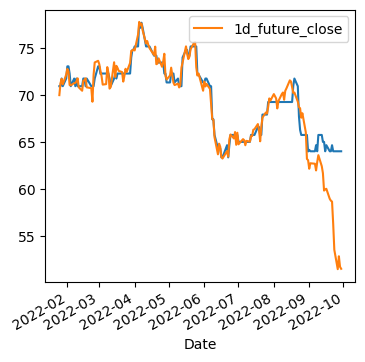

In [34]:
rf_model = RandomForestRegressor(n_estimators=400, max_depth=5, max_features='auto',min_samples_leaf= 2, bootstrap=False)
rf_model.fit(X_train, y_train)
    
y_pred = rf_model.predict(X_val)
y_pred_series = pd.Series(y_pred, index=y_val.index)
#pred_val[str(c)]=y_pred_series
    
X=data[feature]
y = data['1d_future_close']
pred = rf_model.predict(X)
pred_series = pd.Series(pred, index=y.index)
#pred_price[str(c)]=pred_series
    

print('Mean Squared Error:', metrics.mean_squared_error(y_val, y_pred))
mse=metrics.mean_squared_error(y_val, y_pred)
mean_mse.append(mse)
ax = pred_series.plot( figsize=(4, 4))
data.plot(ax=ax, y='1d_future_close')
plt.show()

In [35]:
df_pred['ngg']=y_pred_series

# pdd

In [36]:
data=stock_data(df,'pdd')
data, feature=gen_feature(data)
X_train, y_train ,X_val, y_val=train_val_split(data,feature)

In [293]:
grid ={'bootstrap': [True,False],
 'max_depth': [3,5],
 'max_features': ['auto','sqrt'],
 'min_samples_leaf': [2],
 'n_estimators': [400]}
val_scores = []

rf_model = RandomForestRegressor()

for g in ParameterGrid(grid):
    rf_model.set_params(**g) 
    rf_model.fit(X_train, y_train)
    val_scores.append(rf_model.score(X_val, y_val))

best_index = np.argmax(val_scores)

print(val_scores[best_index],ParameterGrid(grid)[best_index])

0.4966601065026164 {'n_estimators': 400, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 5, 'bootstrap': True}


Mean Squared Error: 38.301616680136796


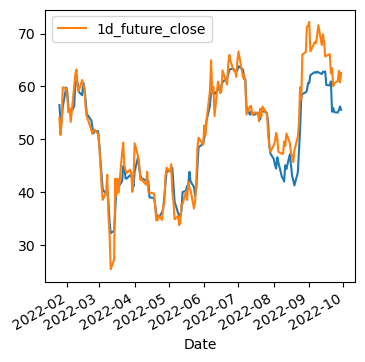

In [37]:
rf_model = RandomForestRegressor(n_estimators=400, max_depth=5, max_features='sqrt',min_samples_leaf= 2, bootstrap=True)
rf_model.fit(X_train, y_train)
    
y_pred = rf_model.predict(X_val)
y_pred_series = pd.Series(y_pred, index=y_val.index)
#pred_val[str(c)]=y_pred_series
    
X=data[feature]
y = data['1d_future_close']
pred = rf_model.predict(X)
pred_series = pd.Series(pred, index=y.index)
#pred_price[str(c)]=pred_series
    

print('Mean Squared Error:', metrics.mean_squared_error(y_val, y_pred))
mse=metrics.mean_squared_error(y_val, y_pred)
mean_mse.append(mse)
ax = pred_series.plot( figsize=(4, 4))
data.plot(ax=ax, y='1d_future_close')
plt.show()

In [38]:
df_pred['pdd']=y_pred_series

# ryaay

In [39]:
data=stock_data(df,'ryaay')
data, feature=gen_feature(data)
X_train, y_train ,X_val, y_val=train_val_split(data,feature)

In [299]:
grid ={'bootstrap': [True,False],
 'max_depth': [3,5],
 'max_features': ['auto','sqrt'],
 'min_samples_leaf': [2],
 'n_estimators': [400]}
val_scores = []

rf_model = RandomForestRegressor()

for g in ParameterGrid(grid):
    rf_model.set_params(**g) 
    rf_model.fit(X_train, y_train)
    val_scores.append(rf_model.score(X_val, y_val))

best_index = np.argmax(val_scores)

print(val_scores[best_index],ParameterGrid(grid)[best_index])

0.4541290984273937 {'n_estimators': 400, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 5, 'bootstrap': True}


Mean Squared Error: 14.394658944408011


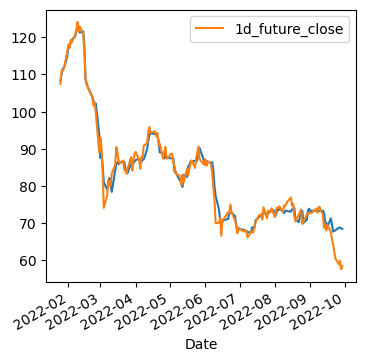

In [40]:
rf_model = RandomForestRegressor(n_estimators=400, max_depth=5, max_features='auto',min_samples_leaf= 2, bootstrap=True)
rf_model.fit(X_train, y_train)
    
y_pred = rf_model.predict(X_val)
y_pred_series = pd.Series(y_pred, index=y_val.index)
#pred_val[str(c)]=y_pred_series
    
X=data[feature]
y = data['1d_future_close']
pred = rf_model.predict(X)
pred_series = pd.Series(pred, index=y.index)
#pred_price[str(c)]=pred_series
    

print('Mean Squared Error:', metrics.mean_squared_error(y_val, y_pred))
mse=metrics.mean_squared_error(y_val, y_pred)
mean_mse.append(mse)
ax = pred_series.plot( figsize=(4, 4))
data.plot(ax=ax, y='1d_future_close')
plt.show()

In [41]:
df_pred['ryaay']=y_pred_series

# tsla

In [42]:
data=stock_data(df,'tsla')
data, feature=gen_feature(data)
X_train, y_train ,X_val, y_val=train_val_split(data,feature)

In [317]:
grid ={'bootstrap': [True],
 'max_depth': [5,7,10],
 'max_features': ['auto'],
 'min_samples_leaf': [2],
 'n_estimators': [400,800]}
val_scores = []

rf_model = RandomForestRegressor()

for g in ParameterGrid(grid):
    rf_model.set_params(**g) 
    rf_model.fit(X_train, y_train)
    val_scores.append(rf_model.score(X_val, y_val))

best_index = np.argmax(val_scores)

print(val_scores[best_index],ParameterGrid(grid)[best_index])

-1.042803584502488 {'n_estimators': 800, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 7, 'bootstrap': True}


Mean Squared Error: 316.56432432809436


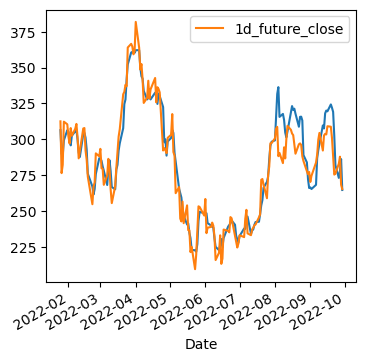

In [43]:
rf_model = RandomForestRegressor(n_estimators=800, max_depth=10, max_features='auto',min_samples_leaf= 4, bootstrap=True)
rf_model.fit(X_train, y_train)
    
y_pred = rf_model.predict(X_val)
y_pred_series = pd.Series(y_pred, index=y_val.index)
#pred_val[str(c)]=y_pred_series
    
X=data[feature]
y = data['1d_future_close']
pred = rf_model.predict(X)
pred_series = pd.Series(pred, index=y.index)
#pred_price[str(c)]=pred_series
    

print('Mean Squared Error:', metrics.mean_squared_error(y_val, y_pred))
mse=metrics.mean_squared_error(y_val, y_pred)
mean_mse.append(mse)
ax = pred_series.plot( figsize=(4, 4))
data.plot(ax=ax, y='1d_future_close')
plt.show()

In [44]:
df_pred['tsla']=y_pred_series

# Prediction

aapl
--------
Mean Squared Error: 13.256588658726395


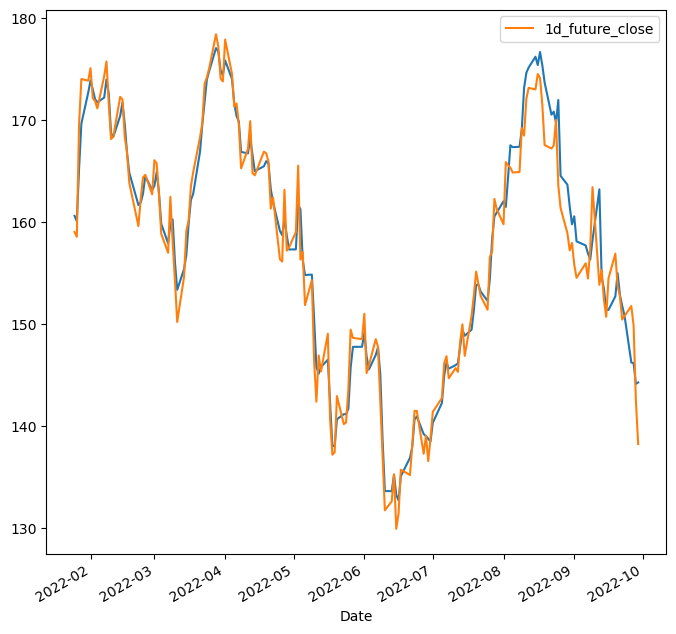

amd
--------
Mean Squared Error: 28.458156362329213


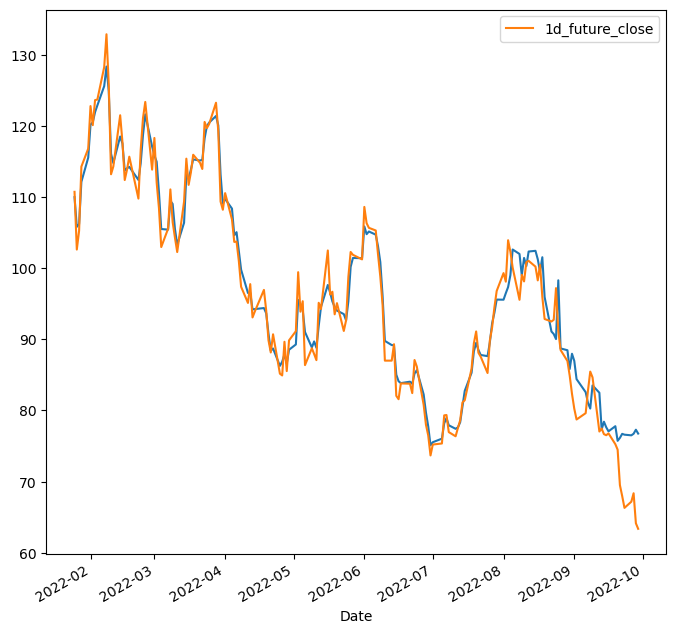

ba
--------
Mean Squared Error: 41.90329399131012


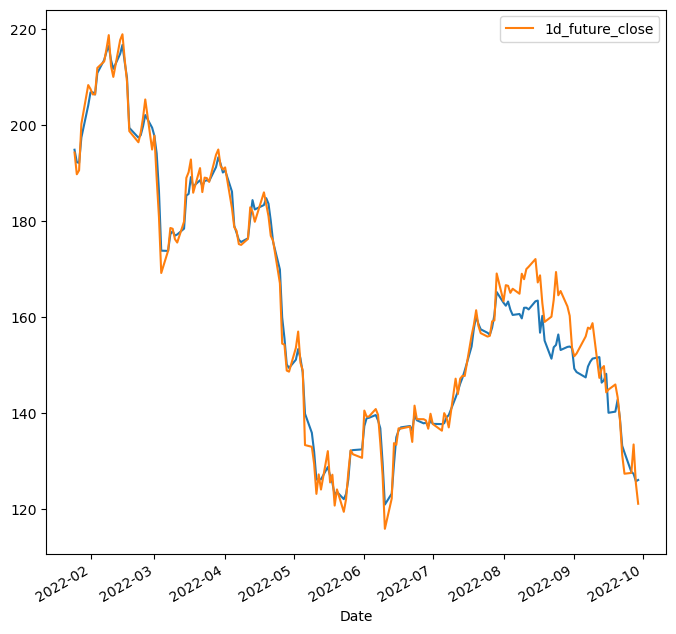

biib
--------
Mean Squared Error: 276.47008666285274


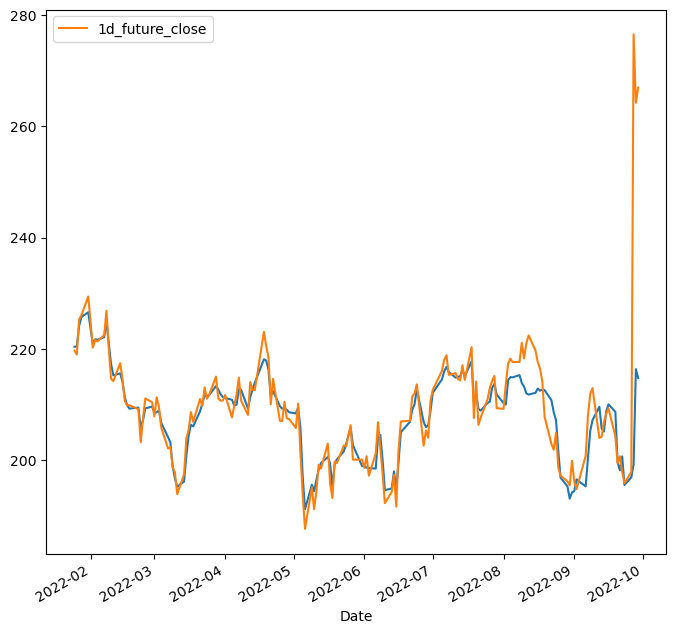

jpm
--------
Mean Squared Error: 13.785992969845514


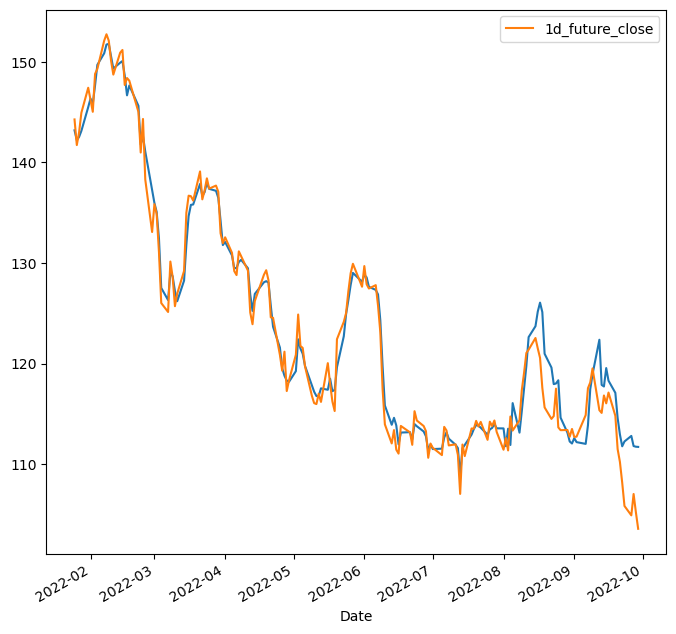

meta
--------
Mean Squared Error: 203.1406846406249


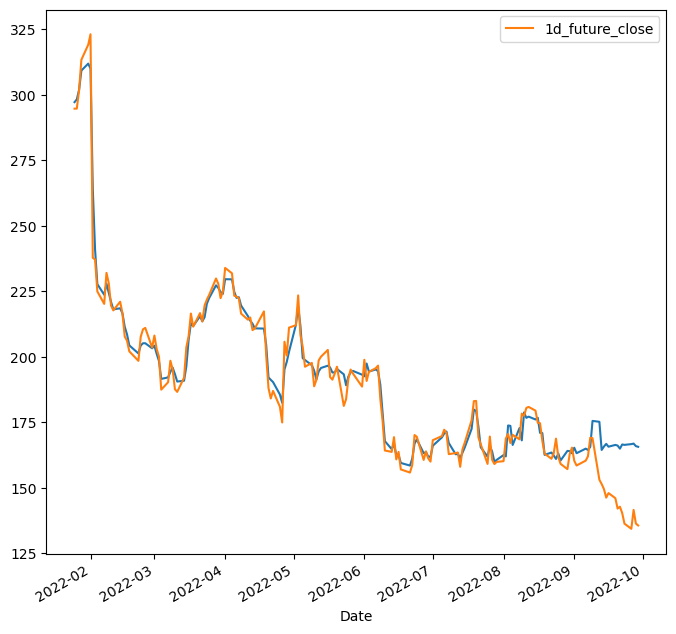

ngg
--------
Mean Squared Error: 25.267283814587234


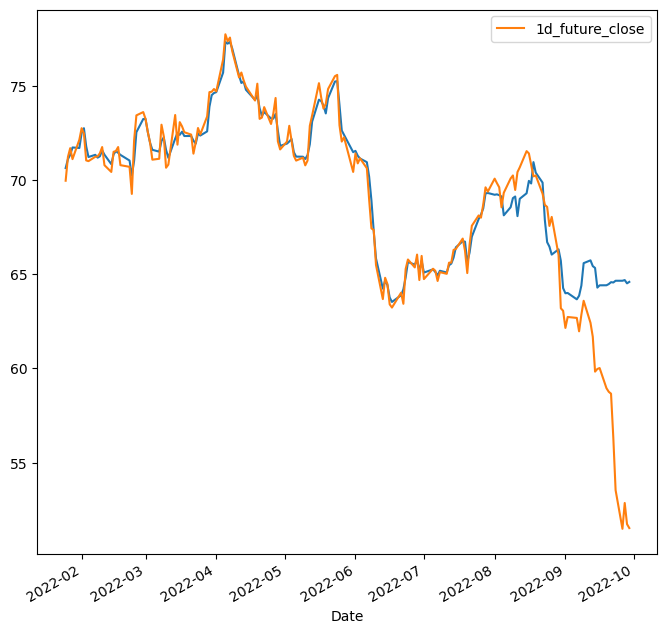

pdd
--------
Mean Squared Error: 42.797544859600535


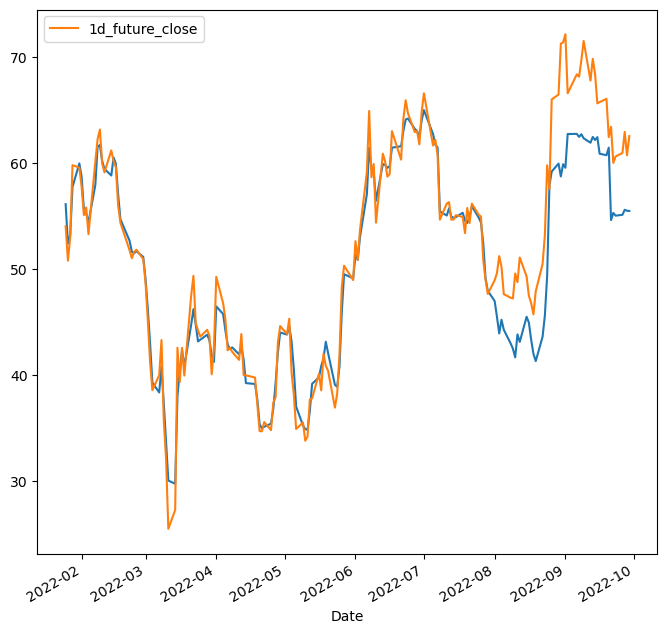

ryaay
--------
Mean Squared Error: 14.896640188612169


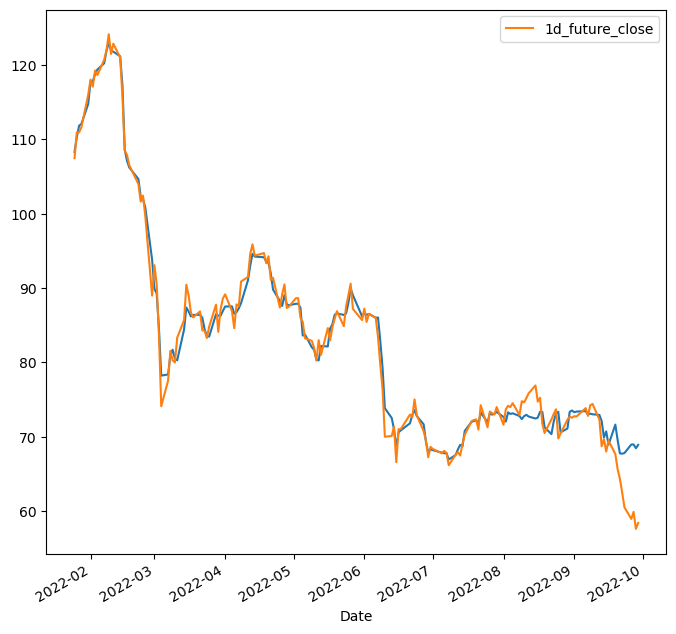

tsla
--------
Mean Squared Error: 380.92564991158474


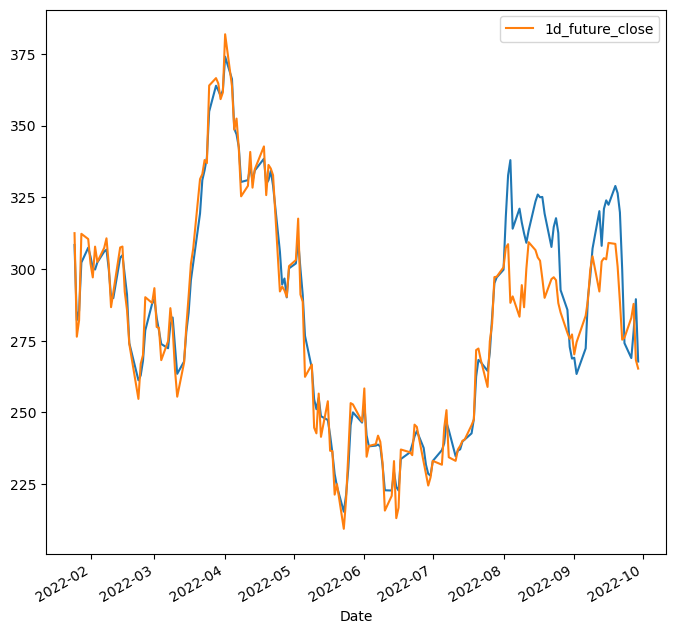

In [13]:
pred_val=pd.DataFrame()
pred_price=pd.DataFrame()
company=df_close.columns.values
mean_mse=[]
for c in company:
    data=stock_data(df,c)
    data, feature=gen_feature(data)
    X_train, y_train ,X_val, y_val=train_val_split(data,feature)
    
    rf_model = RandomForestRegressor(n_estimators=500, max_depth=7, max_features=5, random_state=42)
    rf_model.fit(X_train, y_train)
    
    y_pred = rf_model.predict(X_val)
    y_pred_series = pd.Series(y_pred, index=y_val.index)
    pred_val[str(c)]=y_pred_series
    
    X=data[feature]
    y = data['1d_future_close']
    pred = rf_model.predict(X)
    pred_series = pd.Series(pred, index=y.index)
    pred_price[str(c)]=pred_series
    
    print(c)
    print('--------')
    print('Mean Squared Error:', metrics.mean_squared_error(y_val, y_pred))
    mse=metrics.mean_squared_error(y_val, y_pred)
    mean_mse.append(mse)
    ax = pred_series.plot( figsize=(8, 8))
    data.plot(ax=ax, y='1d_future_close')
    plt.show()

In [14]:
mean=mean(mean_mse)
mean

104.09019220600736

In [15]:
pred_val.head()

,aapl,amd,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-08-01,162.051931,95.552706,162.971159,210.206878,113.549938,162.517936,69.215089,47.019740,72.663467,299.715648
2022-08-02,161.485069,96.470650,162.358002,209.928750,111.785324,162.015882,69.237035,45.547103,72.050384,318.241090
2022-08-03,164.426702,97.325435,163.225386,214.294021,113.519971,173.805008,69.191898,43.962670,73.289488,332.666871
2022-08-04,167.545381,98.992907,161.522454,214.861581,111.903937,173.656792,69.124908,45.258511,73.068966,337.934272
2022-08-05,167.359595,102.605002,160.430537,214.816525,116.064004,166.376033,68.124212,44.311355,73.162724,314.025910


In [16]:
pred_r=pred_price.pct_change().dropna()
pred_r

,aapl,amd,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-01-26,-0.003257,-0.037929,-0.013259,0.000259,-0.006902,0.003517,0.006684,-0.066290,0.018370,-0.085056
2022-01-27,0.032584,0.003620,-0.000861,0.016651,0.002315,0.012327,0.003289,0.016087,0.013936,0.011665
2022-01-28,0.026400,0.055939,0.027501,0.007252,0.004207,0.024285,0.005404,0.084675,0.002124,0.058885
2022-01-31,0.017961,0.030332,0.033940,0.003840,0.016494,0.008498,-0.000380,0.038345,0.024084,0.017154
2022-02-01,0.006890,0.040015,0.013377,-0.012678,0.005857,-0.006043,0.011000,-0.021365,0.026270,-0.010172
...,...,...,...,...,...,...,...,...,...,...
2022-09-23,-0.006133,-0.001510,-0.010537,-0.025682,0.004291,-0.000895,0.001439,-0.004628,0.001333,-0.085673
2022-09-26,-0.030715,-0.001200,-0.030601,0.007049,0.004918,0.001733,0.000000,0.001420,0.016887,-0.018984
2022-09-27,-0.000470,0.002897,-0.003259,0.011905,-0.008934,0.001188,0.000554,0.008615,0.000067,0.034409


In [17]:
df_return=df_return[df_return.index.isin(pred_r.index)]
df_return

Company,aapl,amd,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-01-26,-0.000563,-0.003779,-0.048163,-0.012190,0.009486,-0.018391,-0.014237,-0.091092,0.010531,0.020699
2022-01-27,-0.002943,-0.073254,-0.023267,-0.003005,-0.017645,0.000034,0.018053,-0.060096,0.032381,-0.115542
2022-01-28,0.069778,0.025731,0.004322,0.028638,0.008946,0.023995,0.006548,0.043675,0.000000,0.020806
2022-01-31,0.026126,0.085614,0.050742,0.003508,0.013574,0.038282,-0.008131,0.127992,0.006039,0.106776
2022-02-01,-0.000973,0.022144,0.040451,0.014911,0.017160,0.018323,0.014483,-0.004011,0.039240,-0.005840
...,...,...,...,...,...,...,...,...,...,...
2022-09-23,-0.015124,-0.022158,-0.053709,-0.014156,-0.018613,-0.016874,-0.039891,-0.053735,-0.028749,-0.045948
2022-09-26,0.002260,-0.024426,-0.029864,-0.010264,-0.021532,-0.028773,-0.049361,0.010158,-0.031840,0.002470
2022-09-27,0.006566,0.013122,0.001335,0.010421,-0.008802,-0.014446,-0.038289,0.005440,-0.025616,0.025108


# Optimization

In [20]:
### Avg predicted return error of past n days:
def cal_mean_return_error(actual,pred,n):
    a=actual-pred
    tmp=a.copy()
    for i in range(n-1):
        a=a+tmp.shift(periods=i+1)
    return a.shift(1)/10
mean_return_error_10=cal_mean_return_error(df_return,pred_r,10)

In [21]:
mean_return_error_10=mean_return_error_10.iloc[10:,:]

In [22]:
mean_return_error_10

Company,aapl,amd,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-02-09,0.001304,-0.000581,-0.005329,-0.001985,0.000514,-0.001760,-0.000365,-0.006834,0.000918,0.001764
2022-02-10,0.002666,0.002317,-0.001176,0.003018,-0.000753,0.007354,0.001653,-0.001087,0.001876,-0.005511
2022-02-11,0.006106,0.011703,0.003762,0.003692,0.001657,0.008411,-0.000035,0.010443,0.002653,0.007493
2022-02-14,-0.000040,0.005838,0.003978,0.000023,0.000676,0.005988,0.000635,0.010729,0.000834,0.006526
2022-02-15,-0.001927,-0.001974,-0.000240,-0.000328,-0.000352,0.001981,0.000775,0.001405,0.004280,-0.005469
...,...,...,...,...,...,...,...,...,...,...
2022-09-23,0.001961,-0.012555,-0.000472,-0.001309,-0.001505,-0.012929,-0.005670,0.005198,-0.004597,-0.001256
2022-09-26,0.000408,-0.013798,-0.004188,-0.001067,-0.003016,-0.012912,-0.009375,-0.002627,-0.009706,0.002395
2022-09-27,0.002992,-0.016403,-0.004669,-0.002131,-0.003956,-0.016041,-0.015261,-0.005004,-0.014915,0.007215


In [23]:
risk_free=0.0404 #for Oct 26 2022
stock_return  = df_return.copy()
def get_optimal_portfolio(num=10000,date='2022-09-29',method='mv'):
    random_p = np.empty((num, 12))
    ### set a random seed so that optimal potfolio might not change over consecutive date
    np.random.seed(7) 
    for i in range(num):
        random10=np.random.random(10)
        random_weight=random10/np.sum(random10)
        mean_return=stock_return.loc[:date,:].mul(random_weight,axis=1).sum(axis=1).mean()
        annual_return=mean_return * 252
#         annual_return=(1+mean_return)**stock_return.loc[:date,:].shape[0]-1
        cov_mat = stock_return.loc[:date,:].cov()
        cov_mat_annual = cov_mat * 252
        random_volatility=np.sqrt(np.dot(random_weight.T,np.dot(cov_mat_annual,random_weight)))
        pred_return=pred_r.loc[date,:].mul(random_weight).sum()
        return_error=mean_return_error_10.loc[date,:].mul(random_weight).sum()
        neg_sharpe_ratio = -(annual_return-risk_free)/random_volatility
    # Minimize var and maximize expected portfolio return and sample period’s abnormal return
        if method == 'mv':
            obj_f=random_volatility-2*pred_return-2*return_error
        elif method == 'sharpe':
            obj_f= neg_sharpe_ratio-10*pred_return-10*return_error
            
        random_p[i][:10]=random_weight
        random_p[i][10]=annual_return
        random_p[i][11]=obj_f
      
    RandomPortfolios=pd.DataFrame(random_p)
    RandomPortfolios.columns=[c +'_weight' for c in company]+['Returns','Obj']

    min_index = RandomPortfolios.Obj.idxmin()

    RandomPortfolios.plot('Obj', 'Returns', kind='scatter', alpha=0.3)
    x = RandomPortfolios.loc[min_index,'Obj']
    y = RandomPortfolios.loc[min_index,'Returns']
    plt.scatter(x, y, color='red')

    plt.text(np.round(x,4),np.round(y,4),(np.round(x,4),np.round(y,4)),ha='left',va='bottom',fontsize=10)
    plt.show()

    numstocks = 10

    GMV_weights = np.array(RandomPortfolios.iloc[min_index, 0:numstocks])

    return GMV_weights

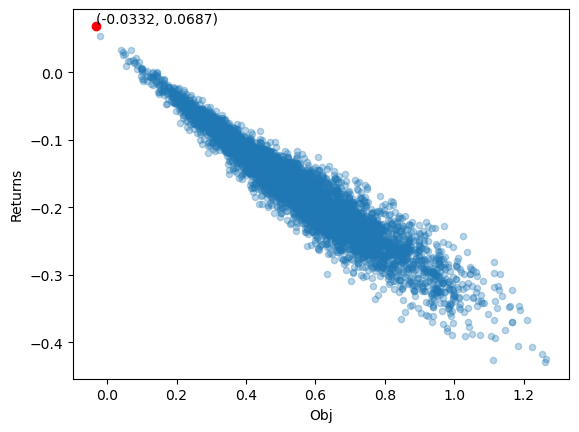

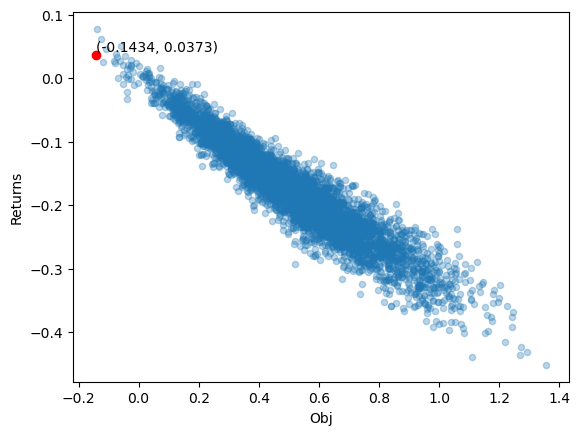

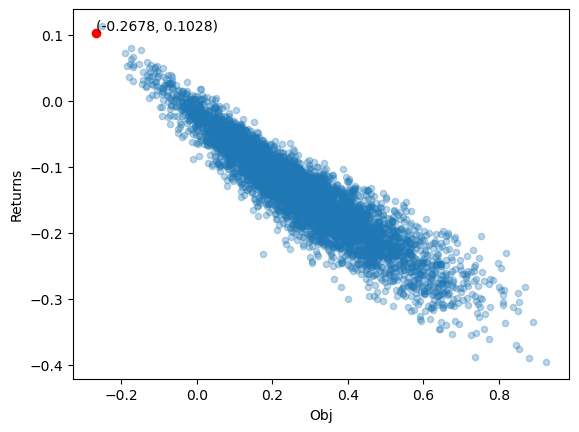

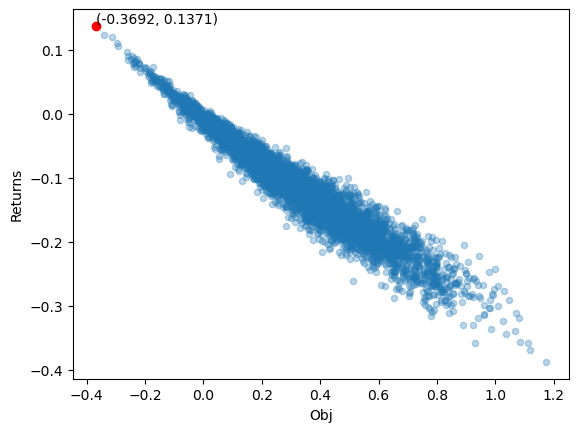

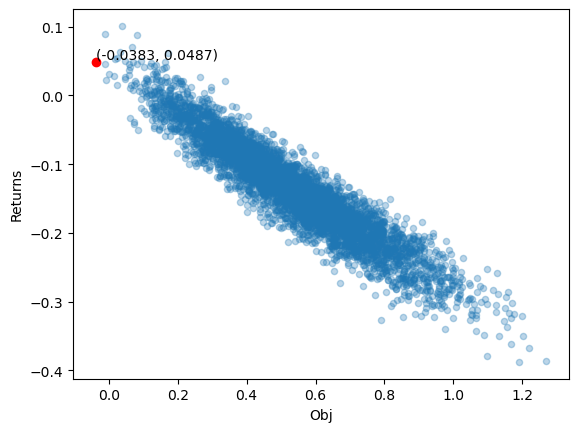

...

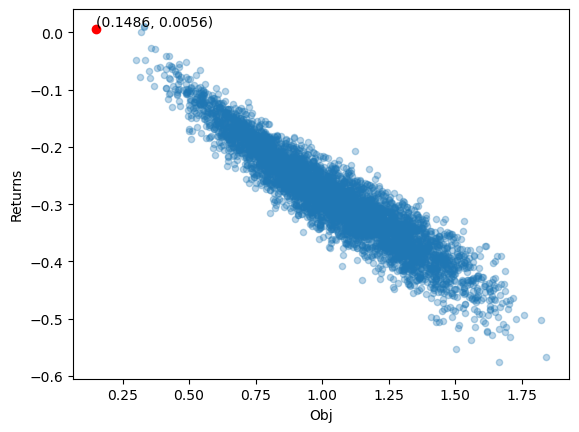

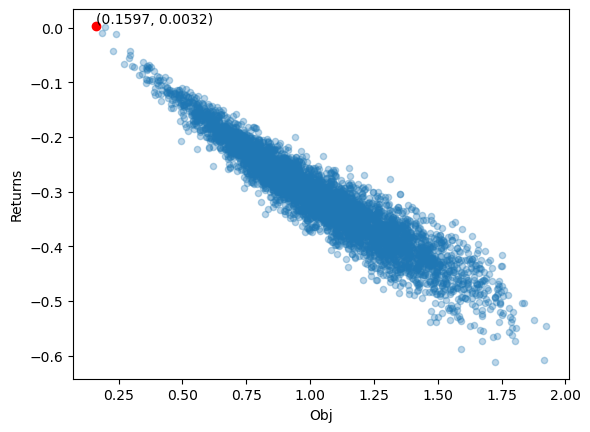

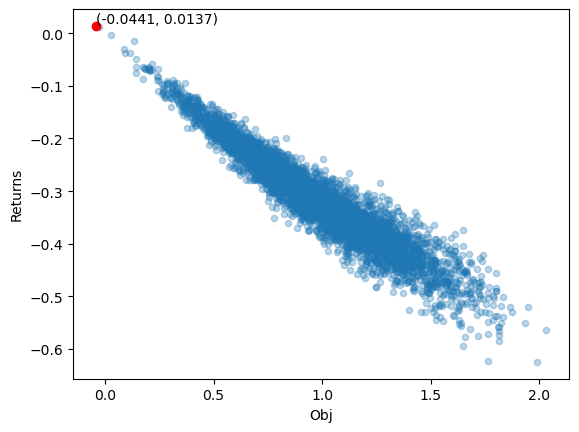

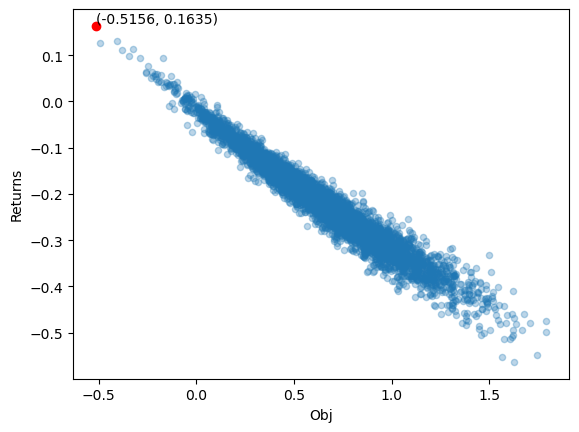

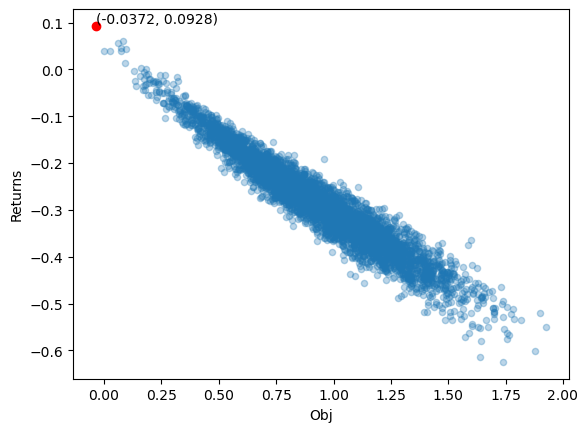

In [24]:
#### get daily optimal weight for Aug and Sep
weight={}
date_list=df_close.loc['2022-08-01':'2022-09-29', :].index
for date in date_list:
    weight[date]=get_optimal_portfolio(num=5000,date=date,method='sharpe')

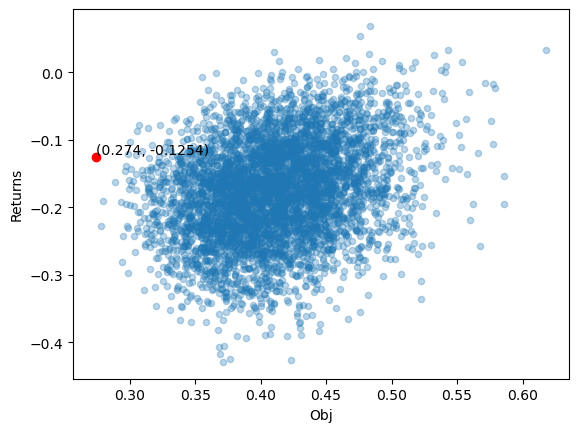

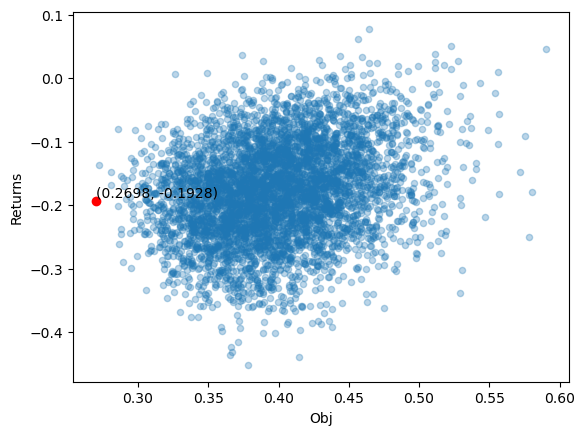

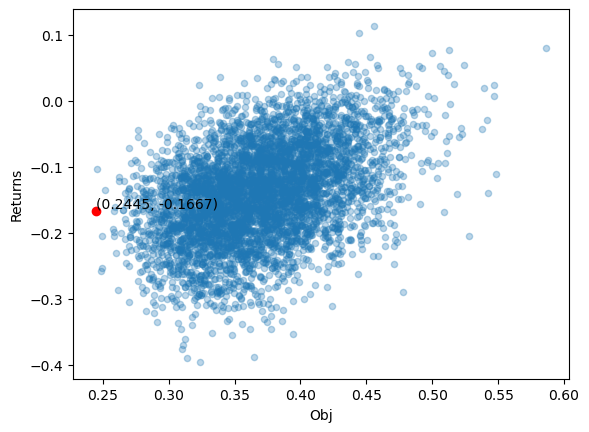

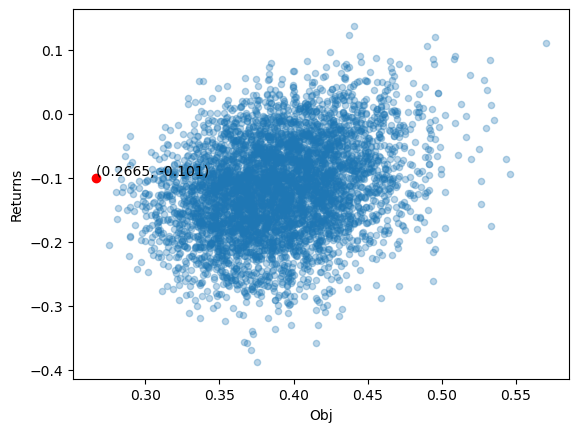

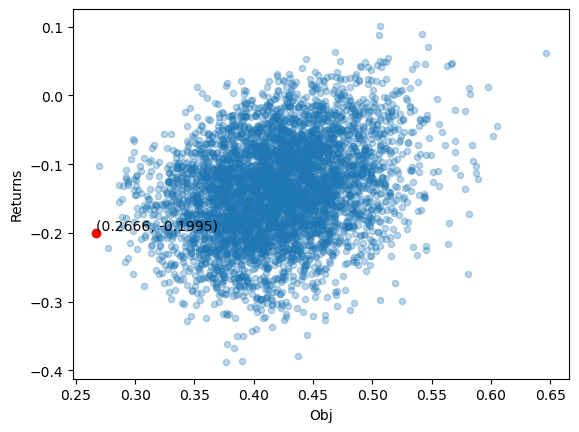

...

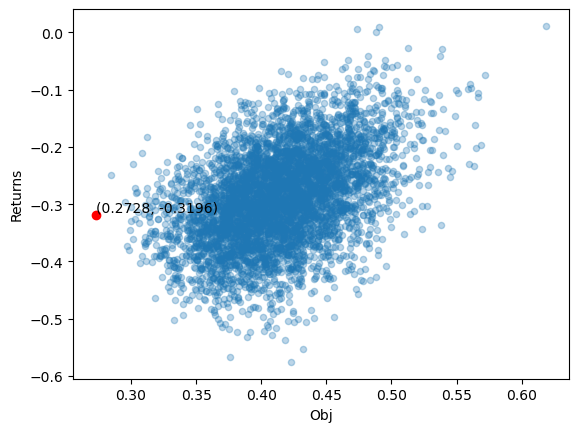

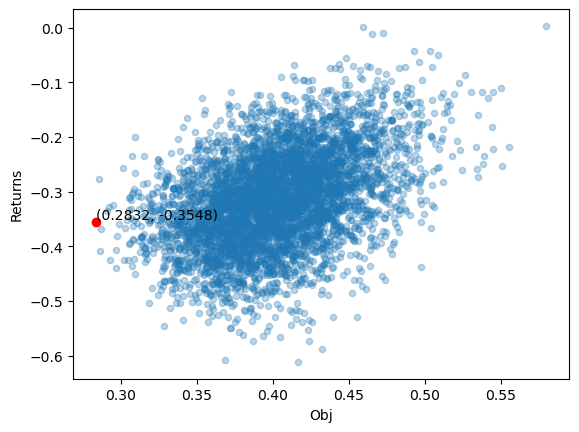

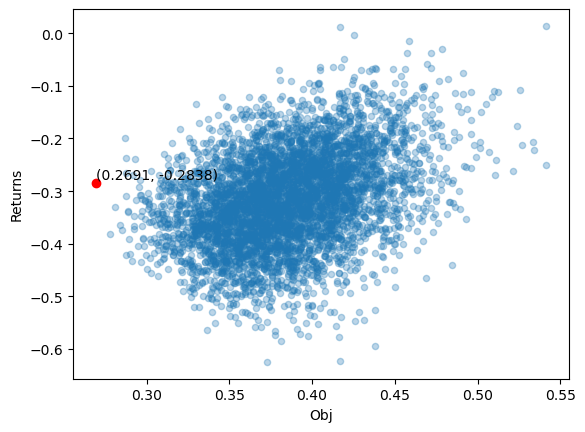

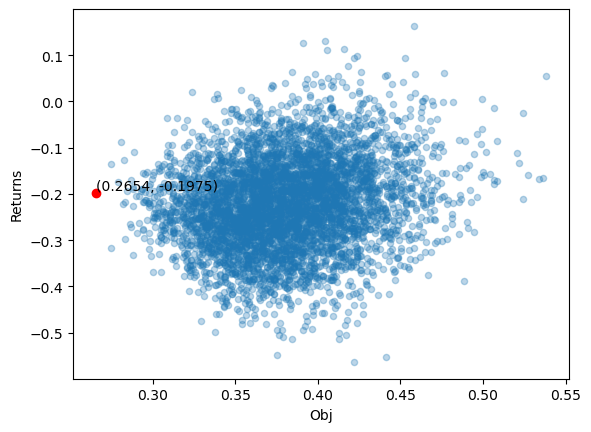

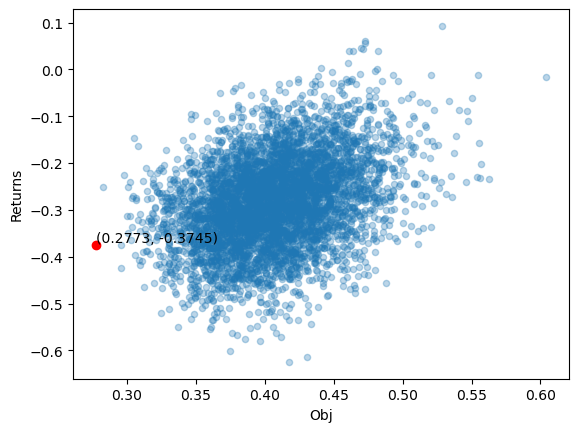

In [25]:
#### get daily optimal weight for Aug and Sep
weight_2={}
date_list=df_close.loc['2022-08-01':'2022-09-29', :].index
for date in date_list:
    weight_2[date]=get_optimal_portfolio(num=5000,date=date,method='mv')


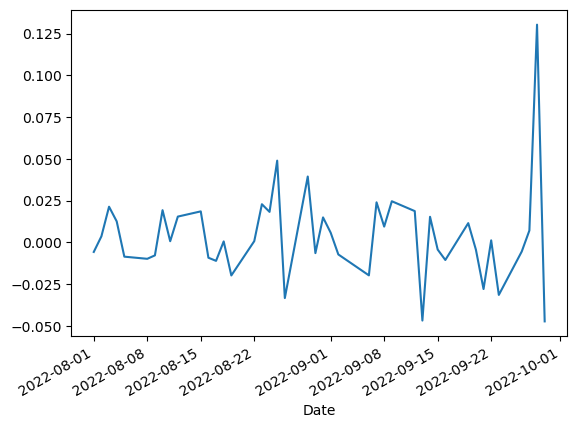

Portfolio validation period return: 16.36%


In [26]:
### Return for Aug and Sep (Sharpe + Prediction)
WeightedReturns = stock_return.loc['2022-08-01':'2022-09-29',:]*pd.DataFrame.from_dict(weight, orient='index',columns=company)
df_return['Portfolio'] = WeightedReturns.sum(axis=1)
df_return.loc['2022-08-01':,:].Portfolio.plot()
plt.show()
print("Portfolio validation period return: {0:.2f}%".format((np.prod(1+WeightedReturns.sum(axis=1))-1)*100))

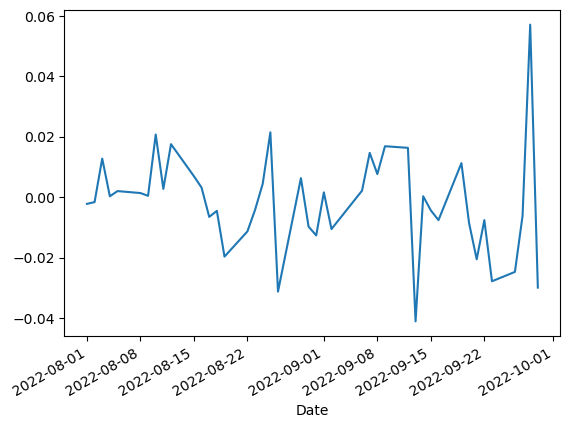

Portfolio validation period return: -6.86%


In [27]:
### Return for Aug and Sep (MV + Prediction)
WeightedReturns=stock_return.loc['2022-08-01':'2022-09-29',:]*pd.DataFrame.from_dict(weight_2, orient='index',columns=company)
df_return['Portfolio'] = WeightedReturns.sum(axis=1)
df_return.loc['2022-08-01':,:].Portfolio.plot()
plt.show()
print("Portfolio validation period return: {0:.2f}%".format((np.prod(1+WeightedReturns.sum(axis=1))-1)*100))

In [51]:
weight[list(weight.keys())[-1]]

array([0.01109897, 0.16107752, 0.05987334, 0.28069741, 0.03793691,
       0.0103098 , 0.03480682, 0.24954222, 0.01179408, 0.14286293])

# Test

In [38]:
df_return=df_close.pct_change().dropna()
df_return.tail()

Company,aapl,amd,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-10-24,0.014803,-0.002040,0.005166,0.026156,0.001227,-0.002231,0.021022,-0.246057,0.000315,-0.014876
2022-10-25,0.019338,0.047189,0.032383,-0.003860,0.002615,0.060052,0.033288,0.069051,0.028535,0.052876
2022-10-26,-0.019627,-0.028307,-0.087692,0.025113,0.011491,-0.055923,0.001676,0.116979,0.031116,0.009981
2022-10-27,-0.030465,-0.018918,0.044622,-0.009129,0.003948,-0.245571,0.008552,0.000377,0.008771,0.002003
2022-10-28,0.075553,0.058191,0.029193,0.023104,0.011878,0.012865,0.019355,-0.003013,0.000000,0.015238


In [56]:
test_df = df_return.loc['2022-10-03':,:]
test_df

Company,aapl,amd,ba,biib,jpm,meta,ngg,pdd,ryaay,tsla
Date,,,,,,,,,,
2022-10-03,0.030753,0.043403,0.041047,-0.010112,0.030909,0.021595,0.026004,0.001119,0.019000,-0.086145
2022-10-04,0.025623,0.027076,0.059183,0.011918,0.046784,0.012048,0.018725,0.060974,0.068201,0.029043
2022-10-05,0.002053,0.000589,-0.010486,-0.021537,-0.012347,-0.009267,-0.025065,-0.004513,-0.016512,-0.034598
2022-10-06,-0.006626,-0.001325,0.000681,0.002178,-0.020382,0.000648,-0.032946,-0.013752,-0.015830,-0.011129
2022-10-07,-0.036719,-0.138688,-0.018230,-0.016663,-0.019974,-0.040411,-0.008468,-0.026050,-0.050690,-0.063243
2022-10-10,0.002356,-0.010780,0.016257,-0.012059,-0.009341,0.002548,-0.017478,-0.083386,0.001198,-0.000493
2022-10-11,-0.010255,-0.003114,-0.002502,-0.002787,-0.028860,-0.039241,-0.016778,-0.043769,-0.018632,-0.028974
2022-10-12,-0.004605,0.003817,-0.008741,-0.001574,0.016183,-0.008091,-0.028372,0.004129,-0.009058,0.003418
2022-10-13,0.033613,0.018842,0.015182,0.064138,0.055593,0.021882,0.042954,-0.010189,0.050448,0.020622


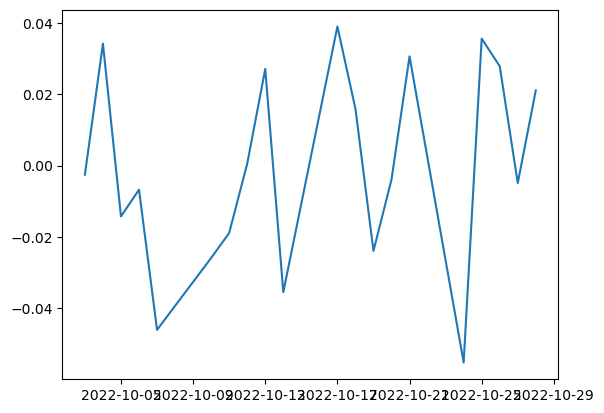

Portfolio test period return: -1.34%


In [52]:
### Return based on (Sharpe + Prediction) last date weight
WeightedReturns=test_df.mul(weight[list(weight.keys())[-1]], axis=1)
plt.plot(WeightedReturns.sum(axis=1))
plt.show()
print("Portfolio test period return: {0:.2f}%".format((np.prod(1+WeightedReturns.sum(axis=1))-1)*100))

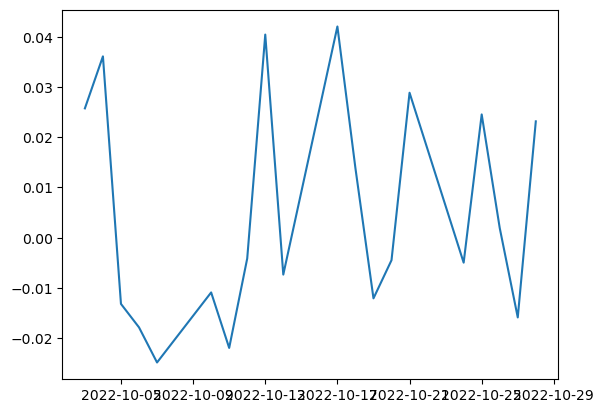

Portfolio test period return: 9.88%


In [53]:
## Return based on (MV + Prediction) last date weight
WeightedReturns=test_df.mul(weight_2[list(weight.keys())[-1]], axis=1)
plt.plot(WeightedReturns.sum(axis=1))
plt.show()
print("Portfolio test period return: {0:.2f}%".format((np.prod(1+WeightedReturns.sum(axis=1))-1)*100))

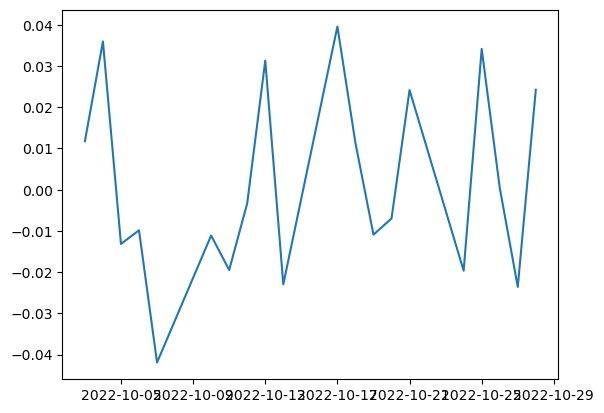

Portfolio test period return: 2.51%


In [54]:
portfolio_weights = np.array([0.1]*10)
WeightedReturns=test_df.mul(portfolio_weights, axis=1)
plt.plot(WeightedReturns.sum(axis=1))
plt.show()
print("Portfolio test period return: {0:.2f}%".format((np.prod(1+WeightedReturns.sum(axis=1))-1)*100))